In [1]:
#pip install facenet-pytorch

In [2]:
import torch
import cv2
import os
import torch.nn.functional as F
from torchvision import transforms
# from mobilefacenet import MobileFaceNet
from blazeface.blazeface import BlazeFace
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


## CREATE DATABASE EMBEDDING VECTORSVECTORS

In [3]:
#Folder hình tạo vector embedding
img_db = 'C:/Users/HP/Desktop/HK6/CS331/BlazeFace-PyTorch/org_face'

#Folder lưu trữ vector embedding
embedding_db = 'C:/Users/HP/Desktop/HK6/CS331/blazeface_mobilefacenet_demo/database_vector'

#Folder lưu trữ output 
output_folder = 'C:/Users/HP/Desktop/HK6/CS331/BlazeFace-PyTorch/result'

In [4]:
def create_database(input_folder_path, output_folder_path):
    # Load mô hình BlazeFace chính diện
    front_net = BlazeFace().to(device)
    front_net.load_weights("blazeface.pth")
    front_net.load_anchors("anchors.npy")
    front_net.min_score_thresh = 0.7
    front_net.min_suppression_threshold = 0.3
    front_net.eval()

    mobilefacenet = torch.jit.load("models/mobilefacenet_scripted.pt", map_location=device)
    mobilefacenet.eval()

    # Transform input face image
    face_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((112, 112)),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])
    for filename in os.listdir(input_folder_path):
        img_path = os.path.join(input_folder_path, filename)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        h, w, _ = img.shape

        detected_face = front_net.predict_on_image(img)
        
        for i, det in enumerate(detected_face):
            ymin, xmin, ymax, xmax = det[:4]
            x1 = int(xmin * w)
            y1 = int(ymin * h)
            x2 = int(xmax * w)
            y2 = int(ymax * h)

            # Cắt khuôn mặt từ ảnh gốc
            face_crop = img[y1:y2, x1:x2]
            if face_crop.size == 0:
                continue  # Tránh lỗi nếu crop ra vùng rỗng

            # Preprocess và đưa qua FaceNet
            face_tensor = face_transform(face_crop).unsqueeze(0).to(device)
            with torch.no_grad():
                embedding = mobilefacenet(face_tensor)  # (1, 512)
                embedding = F.normalize(embedding)  # L2 normalize (tuỳ chọn)
            output_name = f"{os.path.splitext(filename)[0]}_embedding.pt"
            output_path = os.path.join(output_folder_path, output_name)

            torch.save(embedding, output_path)
            # In ra hoặc lưu vector đặc trưng
            print("Đã lưu 1 vector embedding: ", output_name)

        

In [6]:
create_database(img_db, embedding_db)

Đã lưu 1 vector embedding:  ha_img_embedding.pt
Đã lưu 1 vector embedding:  tan_img_embedding.pt
Đã lưu 1 vector embedding:  vy_img_embedding.pt


## FACE RECOGNITION WITH IMAGE

In [10]:
def recognize_image(path_img, path_db, threshold=2.0, show=True):
    # Load BlazeFace
    front_net = BlazeFace().to(device)
    front_net.load_weights("blazeface.pth")
    front_net.load_anchors("anchors.npy")
    front_net.min_score_thresh = 0.7
    front_net.min_suppression_threshold = 0.3
    front_net.eval()

    # Load FaceNet
    mobilefacenet = torch.jit.load("weights/mobilefacenet_scripted.pt", map_location=device)
    mobilefacenet.eval()
    # Transform Face
    face_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((112, 112)),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

    # Load ảnh gốc (giữ nguyên độ phân giải)
    img_orig = cv2.imread(path_img)
    img_rgb = cv2.cvtColor(img_orig.copy(), cv2.COLOR_BGR2RGB)
    img_small = cv2.resize(img_rgb, (128, 128))  # Dùng cho phát hiện
    h, w = img_orig.shape[:2]

    # Detect khuôn mặt
    detected_faces = front_net.predict_on_image(img_small)

    face_db = []
    for filename in os.listdir(path_db):
        if filename.endswith(".pt"):
            emb = torch.load(os.path.join(path_db, filename))
            label = filename.split("_")[0]
            face_db.append((label, emb))

    for det in detected_faces:
        ymin, xmin, ymax, xmax = det[:4]
        # Chuyển tọa độ từ ảnh nhỏ sang ảnh gốc
        x1 = int(xmin * w)
        y1 = int(ymin * h)
        x2 = int(xmax * w)
        y2 = int(ymax * h)

        face_crop = img_rgb[y1:y2, x1:x2]
        if face_crop.size == 0:
            continue

        face_tensor = face_transform(face_crop).unsqueeze(0).to(device)
        with torch.no_grad():
            embedding = mobilefacenet(face_tensor)
            embedding = F.normalize(embedding)

        # So sánh với DB
        min_distance = float("inf")
        recognized_person = "Unknown"

        min_cos_sim = 0
        cs_recognized_person = "Unknown"

        for label, embedding_db in face_db:
            distance = torch.dist(embedding, embedding_db)
            cos_sim = F.cosine_similarity(embedding, embedding_db).item()
            if distance < min_distance:
                    min_distance = distance
                    recognized_person = label

            if cos_sim > min_cos_sim:
                    min_cos_sim = cos_sim
                    cs_recognized_person = label
            print(f"score with {label} - Euclidean: {distance:.4f}, Cosine: {cos_sim:.4f}")

        # if min_distance < threshold:
        #     recognized_person = cs_recognized_person
        # else:
        #     recognized_person = "Unknown"
        print(f"Image was recognized as: {recognized_person} (distance: {min_distance:.4f})")
        print(f"Image was recognized as: {cs_recognized_person} (cos_simsim: {min_cos_sim:.4f})")

        # Vẽ kết quả
        if show:
            cv2.rectangle(img_orig, (x1, y1), (x2, y2), (255, 0, 0), 5)
            label = f"{cs_recognized_person} ({min_cos_sim:.2f})"
            cv2.putText(img_orig, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        1, (255, 0, 0), 2, cv2.LINE_AA)

            # Hiển thị bằng matplotlib
            plt.figure(figsize=(8, 8))
            plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))  # Đổi BGR → RGB
            plt.axis('off')
            plt.title("Face Recognition Result")
            plt.show()
        

score with ha - Euclidean: 0.8320, Cosine: 0.6539
score with tan - Euclidean: 1.1283, Cosine: 0.3634
score with tan - Euclidean: 1.1078, Cosine: 0.3864
score with vy - Euclidean: 1.0305, Cosine: 0.4691
Image was recognized as: ha (distance: 0.8320)
Image was recognized as: ha (cos_simsim: 0.6539)


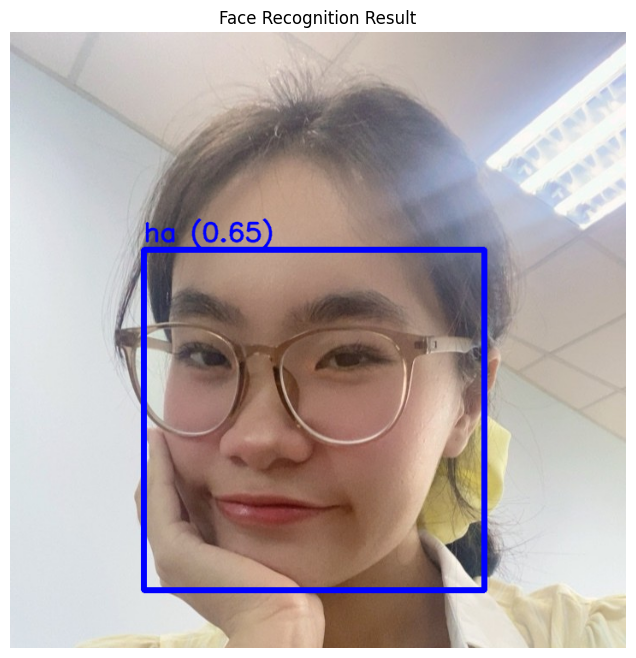

score with ha - Euclidean: 0.7872, Cosine: 0.6901
score with tan - Euclidean: 1.1586, Cosine: 0.3288
score with tan - Euclidean: 1.2112, Cosine: 0.2665
score with vy - Euclidean: 1.0235, Cosine: 0.4762
Image was recognized as: ha (distance: 0.7872)
Image was recognized as: ha (cos_simsim: 0.6901)


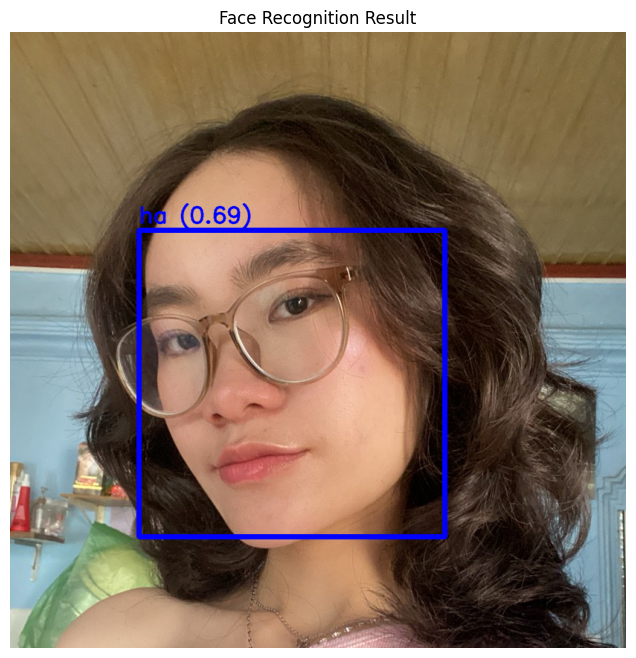

score with ha - Euclidean: 0.9739, Cosine: 0.5258
score with tan - Euclidean: 0.8484, Cosine: 0.6401
score with tan - Euclidean: 1.0151, Cosine: 0.4848
score with vy - Euclidean: 0.7435, Cosine: 0.7236
Image was recognized as: vy (distance: 0.7435)
Image was recognized as: vy (cos_simsim: 0.7236)


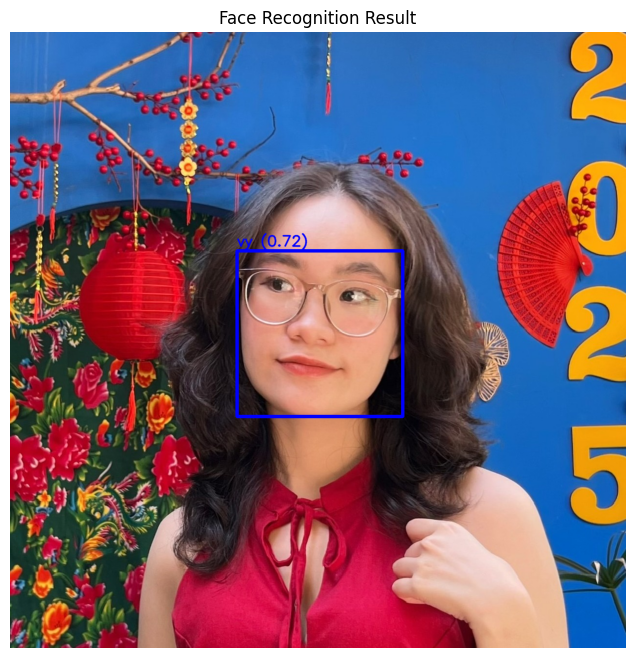

score with ha - Euclidean: 0.7660, Cosine: 0.7066
score with tan - Euclidean: 1.2236, Cosine: 0.2514
score with tan - Euclidean: 1.1396, Cosine: 0.3507
score with vy - Euclidean: 1.0815, Cosine: 0.4152
Image was recognized as: ha (distance: 0.7660)
Image was recognized as: ha (cos_simsim: 0.7066)


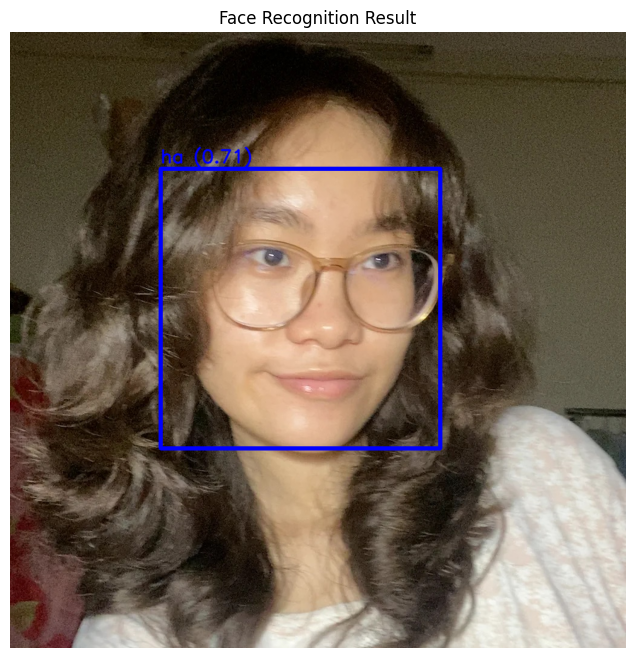

score with ha - Euclidean: 0.7629, Cosine: 0.7090
score with tan - Euclidean: 0.9494, Cosine: 0.5493
score with tan - Euclidean: 1.0332, Cosine: 0.4662
score with vy - Euclidean: 0.7726, Cosine: 0.7015
Image was recognized as: ha (distance: 0.7629)
Image was recognized as: ha (cos_simsim: 0.7090)


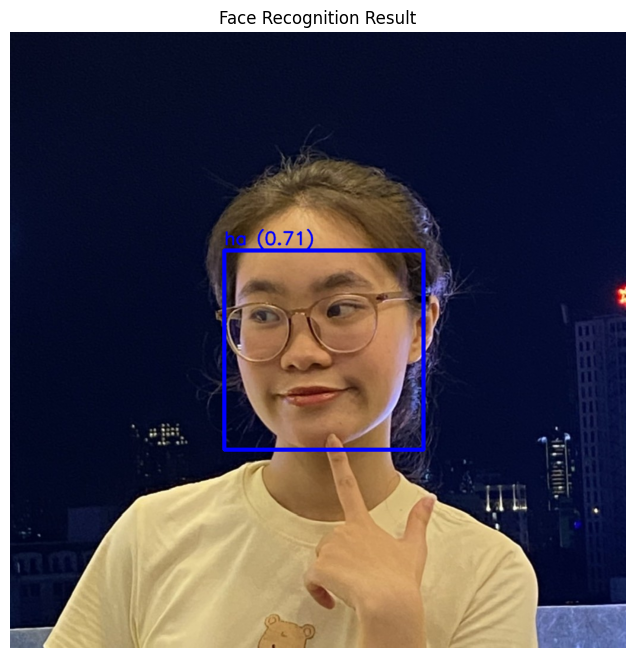

score with ha - Euclidean: 0.9481, Cosine: 0.5506
score with tan - Euclidean: 0.7551, Cosine: 0.7149
score with tan - Euclidean: 0.9433, Cosine: 0.5551
score with vy - Euclidean: 0.7116, Cosine: 0.7468
Image was recognized as: vy (distance: 0.7116)
Image was recognized as: vy (cos_simsim: 0.7468)


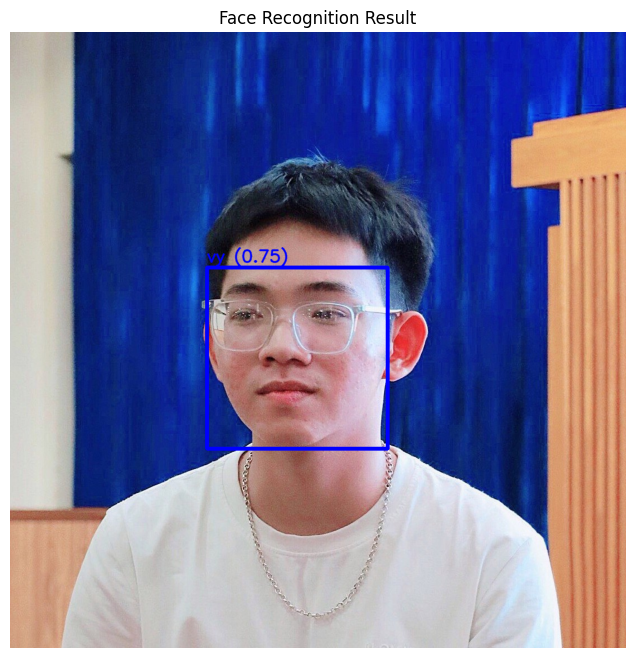

score with ha - Euclidean: 1.0578, Cosine: 0.4406
score with tan - Euclidean: 0.7838, Cosine: 0.6928
score with tan - Euclidean: 1.0213, Cosine: 0.4785
score with vy - Euclidean: 0.8355, Cosine: 0.6510
Image was recognized as: tan (distance: 0.7838)
Image was recognized as: tan (cos_simsim: 0.6928)


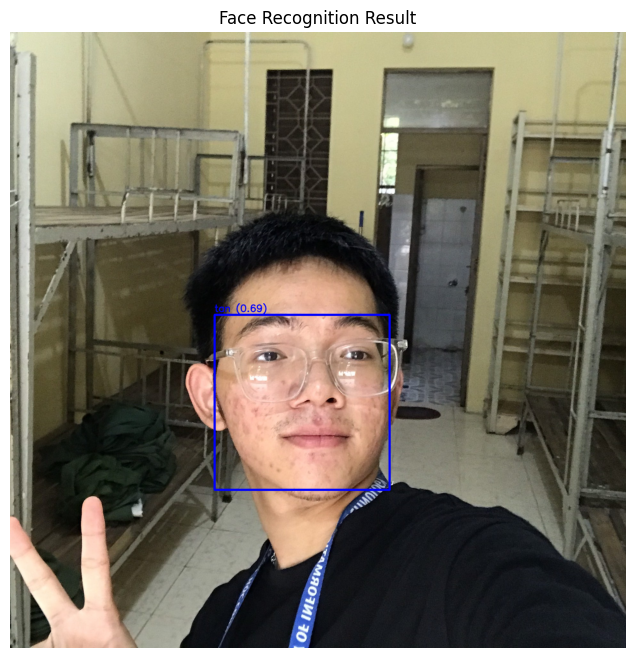

score with ha - Euclidean: 1.1511, Cosine: 0.3375
score with tan - Euclidean: 0.8343, Cosine: 0.6520
score with tan - Euclidean: 1.0003, Cosine: 0.4997
score with vy - Euclidean: 0.8451, Cosine: 0.6429
Image was recognized as: tan (distance: 0.8343)
Image was recognized as: tan (cos_simsim: 0.6520)


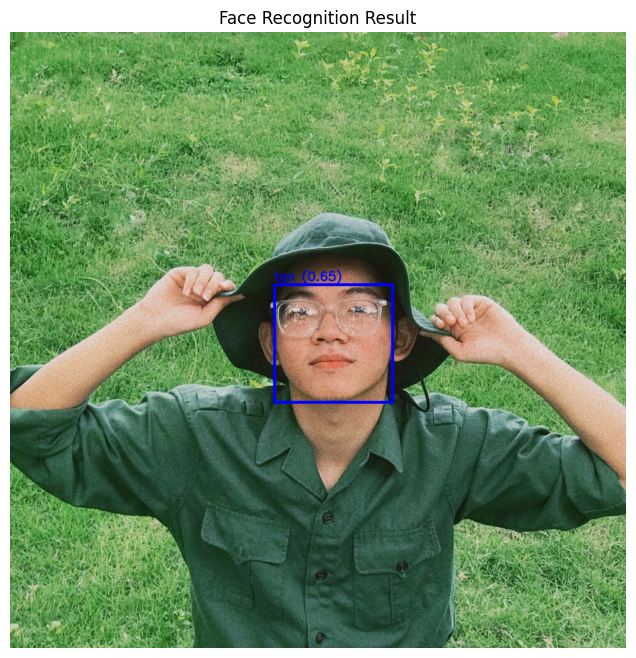

score with ha - Euclidean: 1.0164, Cosine: 0.4834
score with tan - Euclidean: 0.7300, Cosine: 0.7336
score with tan - Euclidean: 0.8953, Cosine: 0.5992
score with vy - Euclidean: 0.7589, Cosine: 0.7120
Image was recognized as: tan (distance: 0.7300)
Image was recognized as: tan (cos_simsim: 0.7336)


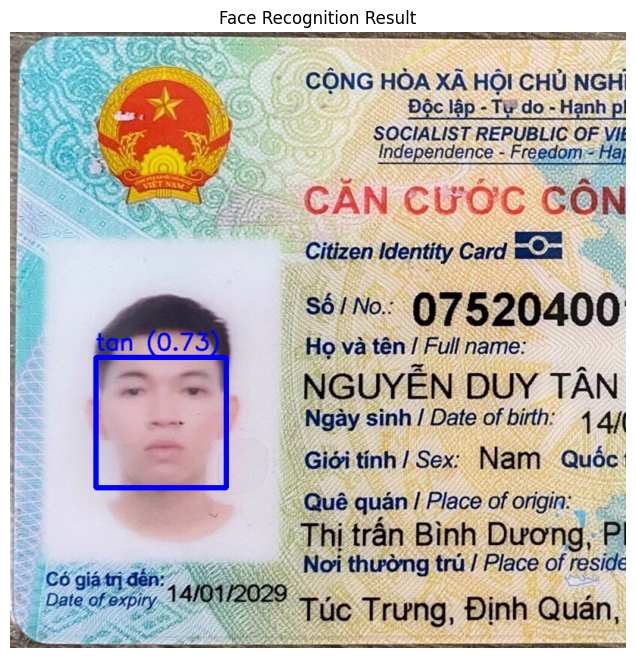

score with ha - Euclidean: 1.0447, Cosine: 0.4543
score with tan - Euclidean: 1.1638, Cosine: 0.3228
score with tan - Euclidean: 1.1834, Cosine: 0.2998
score with vy - Euclidean: 1.1021, Cosine: 0.3927
Image was recognized as: ha (distance: 1.0447)
Image was recognized as: ha (cos_simsim: 0.4543)


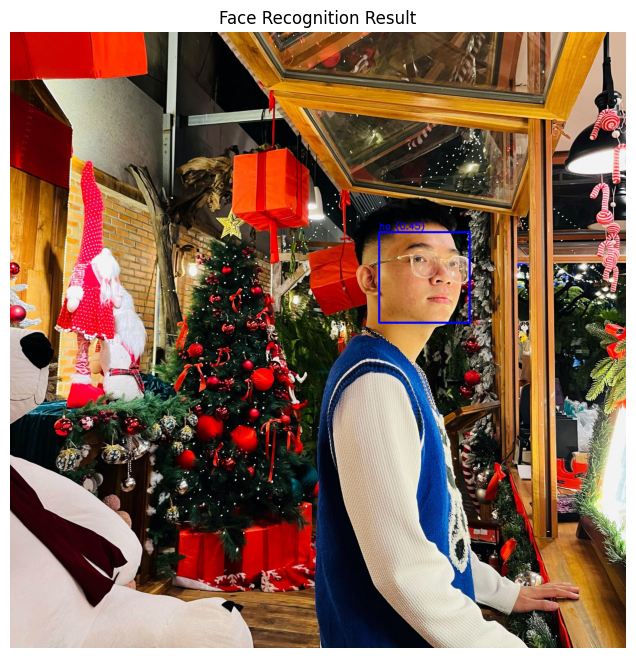

score with ha - Euclidean: 1.1505, Cosine: 0.3381
score with tan - Euclidean: 1.2918, Cosine: 0.1656
score with tan - Euclidean: 1.2486, Cosine: 0.2205
score with vy - Euclidean: 1.3587, Cosine: 0.0769
Image was recognized as: ha (distance: 1.1505)
Image was recognized as: ha (cos_simsim: 0.3381)


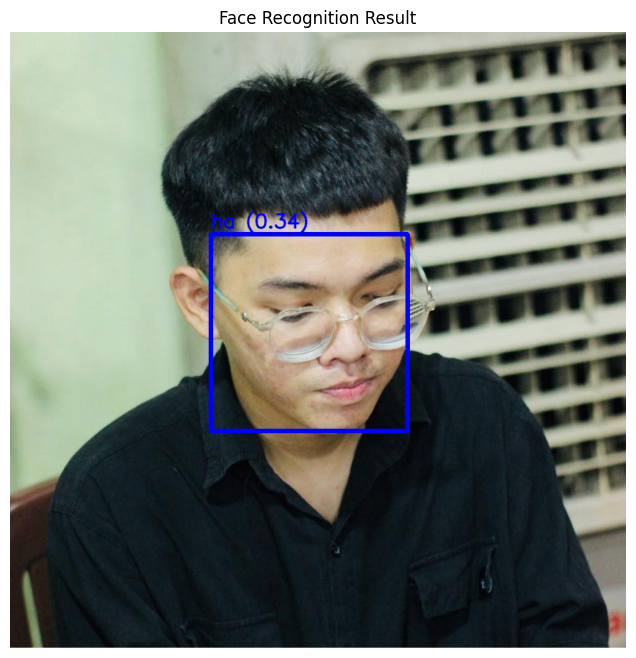

score with ha - Euclidean: 0.9922, Cosine: 0.5078
score with tan - Euclidean: 0.7459, Cosine: 0.7218
score with tan - Euclidean: 0.6897, Cosine: 0.7621
score with vy - Euclidean: 0.9322, Cosine: 0.5655
Image was recognized as: tan (distance: 0.6897)
Image was recognized as: tan (cos_simsim: 0.7621)


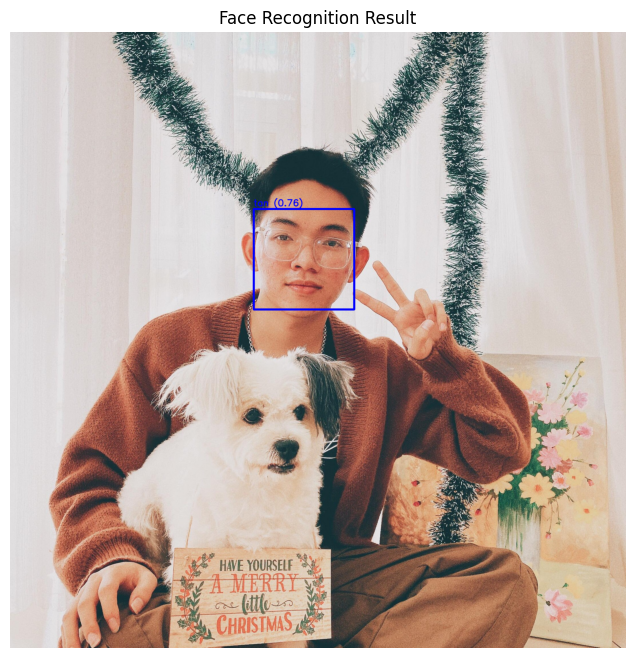

score with ha - Euclidean: 0.9568, Cosine: 0.5423
score with tan - Euclidean: 0.7878, Cosine: 0.6897
score with tan - Euclidean: 0.8944, Cosine: 0.6000
score with vy - Euclidean: 0.8029, Cosine: 0.6776
Image was recognized as: tan (distance: 0.7878)
Image was recognized as: tan (cos_simsim: 0.6897)


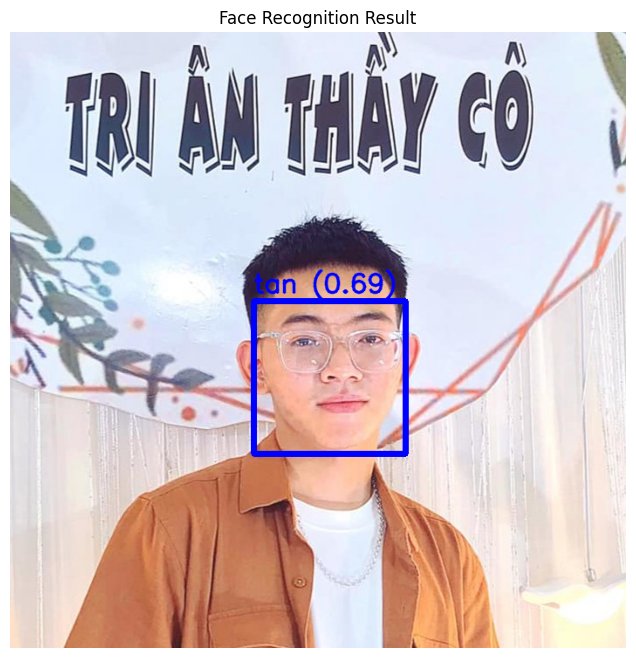

score with ha - Euclidean: 1.0759, Cosine: 0.4212
score with tan - Euclidean: 1.2276, Cosine: 0.2465
score with tan - Euclidean: 1.2598, Cosine: 0.2064
score with vy - Euclidean: 1.2217, Cosine: 0.2537
Image was recognized as: ha (distance: 1.0759)
Image was recognized as: ha (cos_simsim: 0.4212)


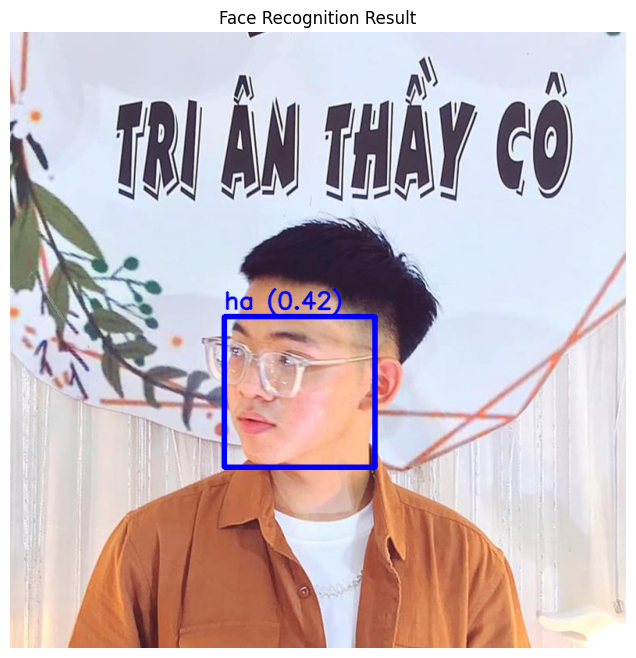

score with ha - Euclidean: 0.9537, Cosine: 0.5452
score with tan - Euclidean: 1.0065, Cosine: 0.4935
score with tan - Euclidean: 1.1177, Cosine: 0.3754
score with vy - Euclidean: 0.9918, Cosine: 0.5082
Image was recognized as: ha (distance: 0.9537)
Image was recognized as: ha (cos_simsim: 0.5452)


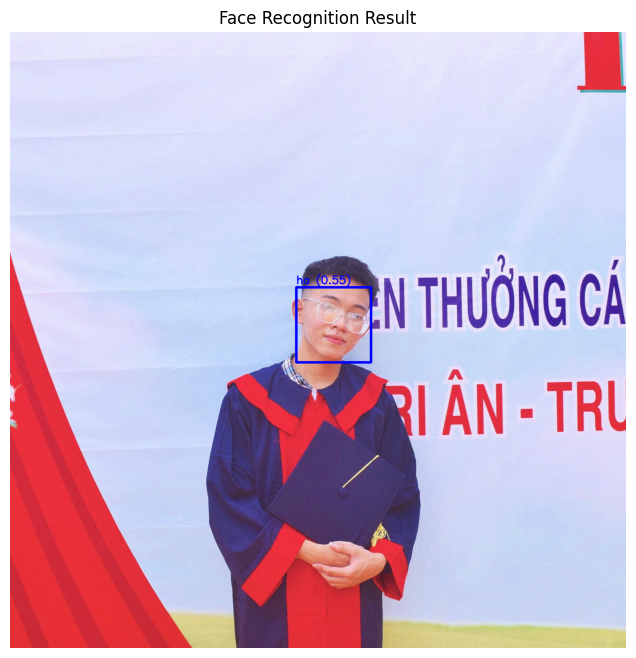

score with ha - Euclidean: 1.0120, Cosine: 0.4879
score with tan - Euclidean: 0.7514, Cosine: 0.7177
score with tan - Euclidean: 0.9177, Cosine: 0.5789
score with vy - Euclidean: 0.7815, Cosine: 0.6946
Image was recognized as: tan (distance: 0.7514)
Image was recognized as: tan (cos_simsim: 0.7177)


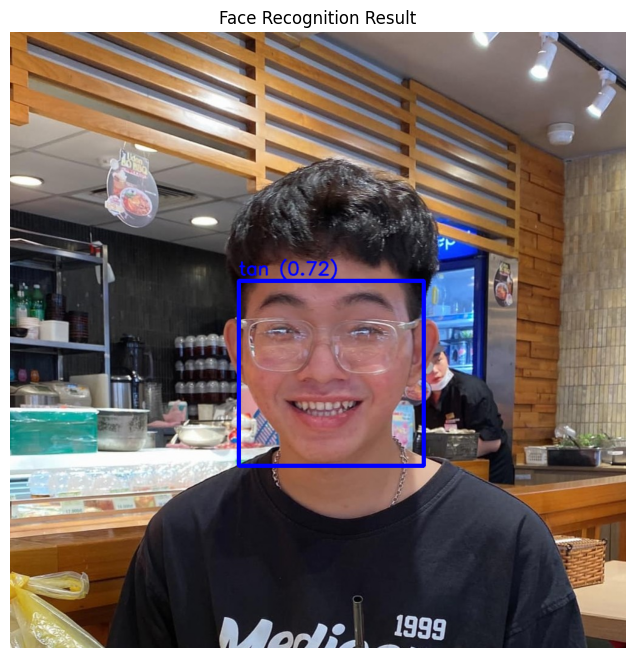

score with ha - Euclidean: 1.1095, Cosine: 0.3845
score with tan - Euclidean: 0.8848, Cosine: 0.6085
score with tan - Euclidean: 1.0125, Cosine: 0.4874
score with vy - Euclidean: 0.8840, Cosine: 0.6093
Image was recognized as: vy (distance: 0.8840)
Image was recognized as: vy (cos_simsim: 0.6093)


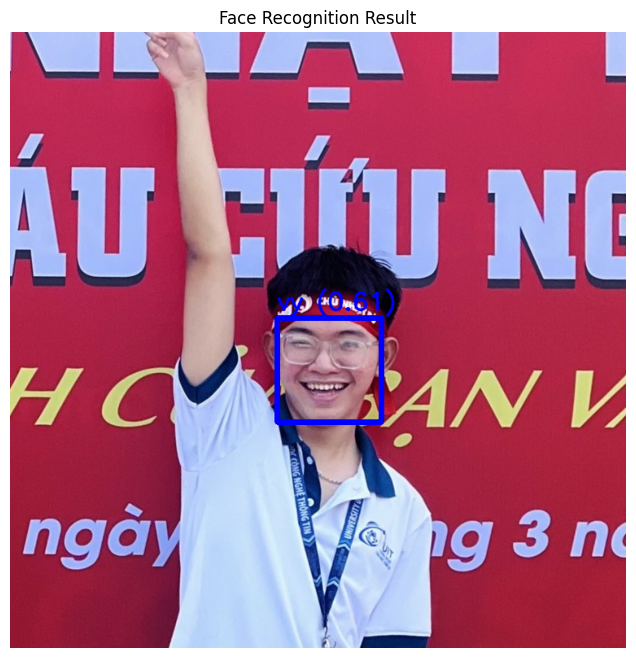

score with ha - Euclidean: 1.1944, Cosine: 0.2867
score with tan - Euclidean: 1.0663, Cosine: 0.4315
score with tan - Euclidean: 1.1030, Cosine: 0.3917
score with vy - Euclidean: 0.9196, Cosine: 0.5771
Image was recognized as: vy (distance: 0.9196)
Image was recognized as: vy (cos_simsim: 0.5771)


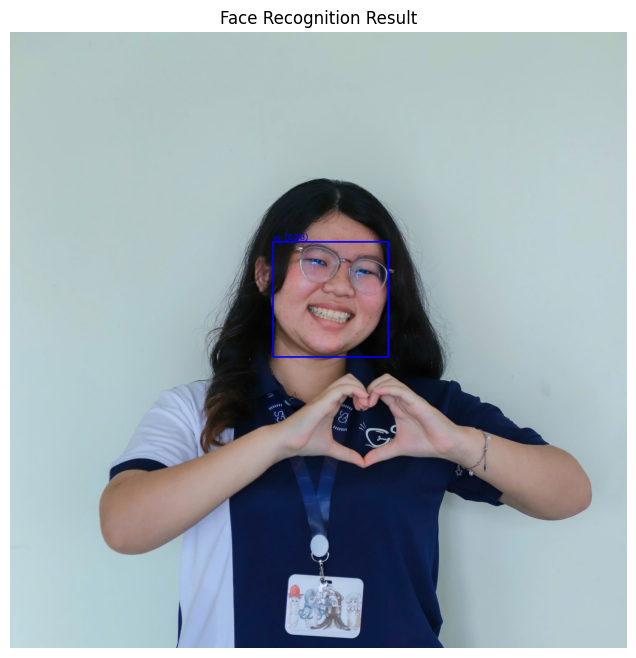

score with ha - Euclidean: 0.8795, Cosine: 0.6132
score with tan - Euclidean: 0.9992, Cosine: 0.5008
score with tan - Euclidean: 1.1216, Cosine: 0.3710
score with vy - Euclidean: 0.9072, Cosine: 0.5885
Image was recognized as: ha (distance: 0.8795)
Image was recognized as: ha (cos_simsim: 0.6132)


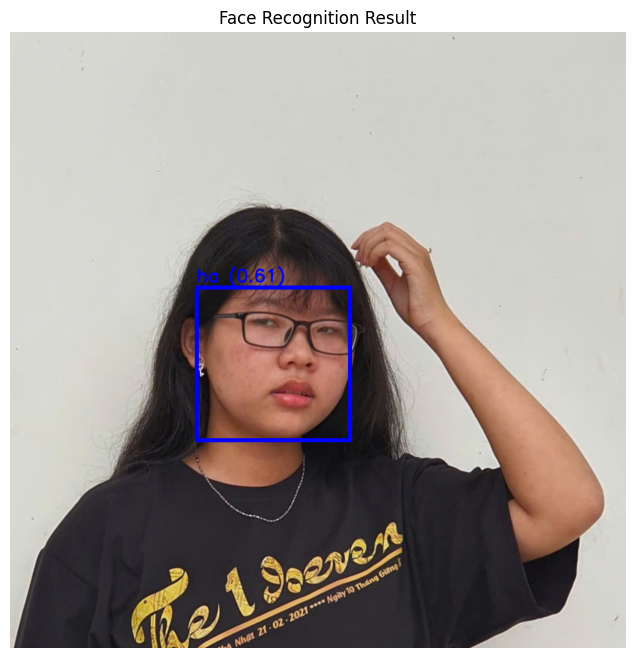

score with ha - Euclidean: 0.9910, Cosine: 0.5090
score with tan - Euclidean: 0.8755, Cosine: 0.6168
score with tan - Euclidean: 0.9639, Cosine: 0.5354
score with vy - Euclidean: 0.5580, Cosine: 0.8443
Image was recognized as: vy (distance: 0.5580)
Image was recognized as: vy (cos_simsim: 0.8443)


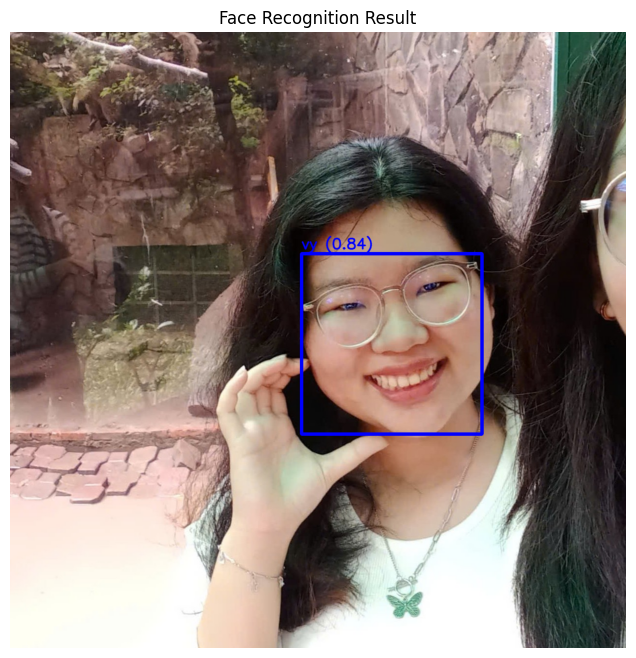

score with ha - Euclidean: 0.9471, Cosine: 0.5515
score with tan - Euclidean: 0.8332, Cosine: 0.6529
score with tan - Euclidean: 0.7645, Cosine: 0.7078
score with vy - Euclidean: 0.7830, Cosine: 0.6935
Image was recognized as: tan (distance: 0.7645)
Image was recognized as: tan (cos_simsim: 0.7078)


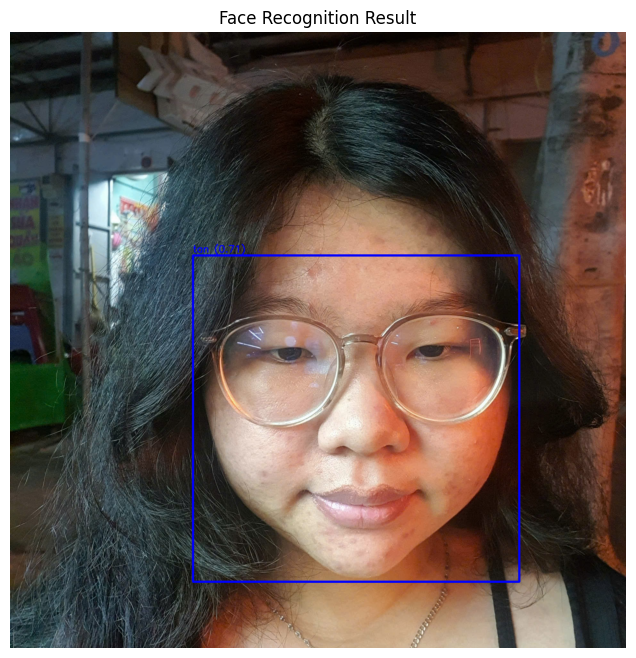

score with ha - Euclidean: 0.9133, Cosine: 0.5829
score with tan - Euclidean: 0.8704, Cosine: 0.6212
score with tan - Euclidean: 1.0776, Cosine: 0.4193
score with vy - Euclidean: 0.8562, Cosine: 0.6335
Image was recognized as: vy (distance: 0.8562)
Image was recognized as: vy (cos_simsim: 0.6335)


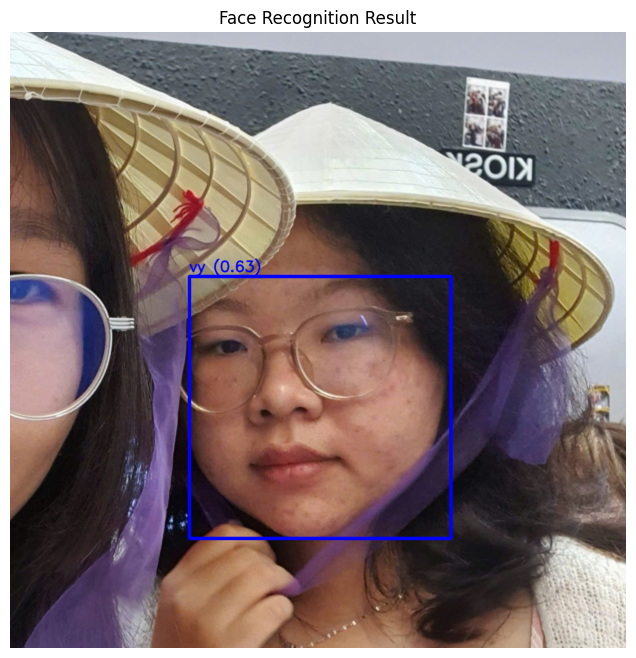

In [14]:
folder_img = 'C:/Users/HP/Desktop/HK6/CS331/BlazeFace-PyTorch/new_face'

for folder_name in (os.listdir(folder_img)):
    folder_path = os.path.join(folder_img, folder_name)
    for filename in (os.listdir(folder_path)):
        if not filename.lower().endswith((".jpg", ".png", ".jpeg")):
            continue
        img_path = os.path.join(folder_path, filename)
        recognize_image(img_path, embedding_db)

## FACE RECOGNITION WITH CAMERA

In [15]:
def recognize_camera(path_db, path_output, threshold=0.95):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Load BlazeFace
    front_net = BlazeFace().to(device)
    front_net.load_weights("blazeface.pth")
    front_net.load_anchors("anchors.npy")
    front_net.min_score_thresh = 0.7
    front_net.min_suppression_threshold = 0.3
    front_net.eval()

    # Load FaceNet
    mobilefacenet = torch.jit.load("weights/mobilefacenet_scripted.pt", map_location=device)
    mobilefacenet.eval()
    # Transform Face
    face_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((112, 112)),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

    cap = cv2.VideoCapture(0)

    # now = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    # filename = f"{now}_output.mp4"
    # output_path = os.path.join(output_folder, filename)
    # fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    # fps = 20.0  # hoặc lấy tự động từ cap.get(cv2.CAP_PROP_FPS)
    # frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    # frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    # out = cv2.VideoWriter(output_folder, fourcc, fps, (frame_width, frame_height))

    face_db = []
    for filename in os.listdir(path_db):
        if filename.endswith(".pt"):
            emb = torch.load(os.path.join(path_db, filename))
            label = filename.split("_")[0]
            face_db.append((label, emb))

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Resize ảnh nhỏ để detect
        img_small = cv2.resize(frame_rgb, (128, 128))
        h_orig, w_orig = frame.shape[:2]

        # Detect khuôn mặt
        with torch.no_grad():
            detected_faces = front_net.predict_on_image(img_small)

        recognized_labels = []

        for det in detected_faces:
            ymin, xmin, ymax, xmax = det[:4]
            # Scale tọa độ về ảnh gốc
            x1 = int(xmin * w_orig)
            y1 = int(ymin * h_orig)
            x2 = int(xmax * w_orig)
            y2 = int(ymax * h_orig)

            face_crop = frame_rgb[y1:y2, x1:x2]
            if face_crop.size == 0:
                continue

            # Preprocess cho FaceNet
            face_tensor = face_transform(face_crop).unsqueeze(0).to(device)
            with torch.no_grad():
                embedding = mobilefacenet(face_tensor)
                embedding = F.normalize(embedding)

            # So sánh với DB
            min_distance = float("inf")
            recognized_person = "Unknown"

            for label, embedding_db in face_db:
                distance = torch.dist(embedding, embedding_db)
                if distance < min_distance:
                        min_distance = distance
                        best_match = label

            if min_distance < threshold:
                recognized_person = best_match
            else:
                recognized_person = "Unknown"

            recognized_labels.append((x1, y1, x2, y2, recognized_person, min_distance))

        # Vẽ kết quả
        for x1, y1, x2, y2, label, distance in recognized_labels:
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            text = f"{label} ({distance:.2f})"
            cv2.putText(frame, text, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6,
                        (0, 255, 0), 2, cv2.LINE_AA)

        cv2.imshow("BlazeFace + FaceNet Recognition", frame)
        # out.write(frame)

        if cv2.waitKey(15) & 0xFF == ord("q"):
            break

    cap.release()
    # out.release()
    cv2.destroyAllWindows()

In [17]:
recognize_camera(embedding_db, output_folder)